In [7]:
# Importing necessary libraries
# For numerical operations
import numpy as np  
# For plotting graphs
import matplotlib.pyplot as plt  
# For styling matplotlib plots
from matplotlib import style  
# To display plots inline in Jupyter notebooks
%matplotlib inline  
# For data manipulation and analysis
import pandas as pd  
# For interacting with the operating system
import os  
# For statistical data visualization
import seaborn as sns  
# For interactive plots using Plotly
import plotly.express as px  
# For detailed Plotly graph objects
import plotly.graph_objects as go  
# Now, you can use these libraries to perform data analysis and create visualizations.

In [8]:
# Specify the path to your CSV file
csv_file_path = r"C:\Users\User\Desktop\project\hotel_revenue_historical_full.csv"

# Load the CSV file into a Pandas DataFrame
df = pd.read_csv(csv_file_path)

In [9]:
hotel_revenue_historical_full=pd.read_csv(r"C:\Users\User\Desktop\project\hotel_revenue_historical_full.csv")

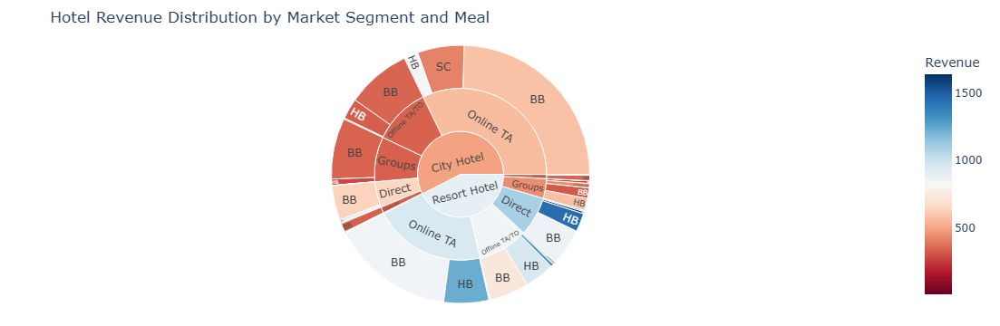

In [10]:
#9 Sunburst Chart
import pandas as pd
import plotly.express as px

# Load the dataset
file_path = r'C:\Users\User\Desktop\project\hotel_revenue_historical_full.csv'
hotel_revenue_historical_full = pd.read_csv(file_path)

# Clean the 'adr', 'Cost', 'Revenue', and 'Discount' columns
hotel_revenue_historical_full[' adr '] = hotel_revenue_historical_full[' adr '].replace(r'[\$,]', '', regex=True).astype(float)
hotel_revenue_historical_full['Cost'] = hotel_revenue_historical_full['Cost'].replace(r'[\$,]', '', regex=True).astype(float)
hotel_revenue_historical_full['Revenue'] = hotel_revenue_historical_full['Revenue'].replace(r'[\$,]', '', regex=True).astype(float)
hotel_revenue_historical_full['Discount'] = hotel_revenue_historical_full['Discount'].replace(r'[\%,]', '', regex=True).astype(float)

# Filter out rows with zero or missing Revenue values
hotel_revenue_historical_full = hotel_revenue_historical_full[hotel_revenue_historical_full['Revenue'] > 0]
hotel_revenue_historical_full.dropna(subset=['Revenue'], inplace=True)

# Create a Sunburst plot to visualize hierarchical hotel and revenue distribution
fig = px.sunburst(hotel_revenue_historical_full, 
                  path=['hotel', 'market_segment', 'meal'], 
                  values='Revenue', 
                  color='Revenue', 
                  color_continuous_scale='RdBu', 
                  title='Hotel Revenue Distribution by Market Segment and Meal')

# Update layout for better visualization
fig.update_layout(margin=dict(t=50, l=25, r=25, b=25))

# Show the interactive plot
fig.show()

# Save the interactive plot as an HTML file
fig.write_html("hotel_revenue_sunburst.html")


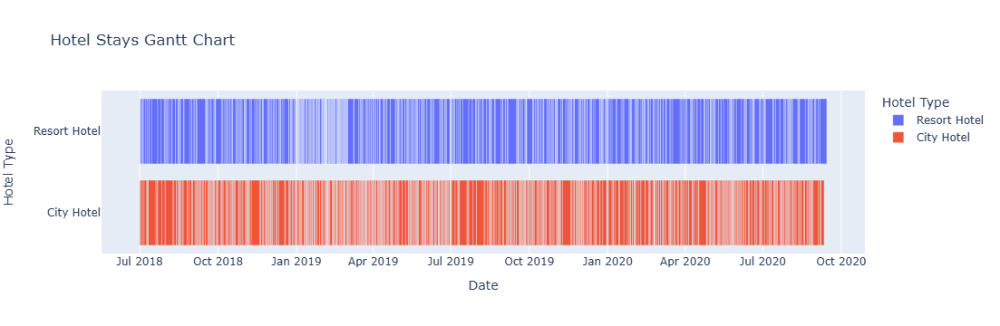

In [11]:
#10 GANTT CHART
import pandas as pd
import plotly.express as px
from datetime import datetime, timedelta

# Load the dataset
file_path = r'C:\Users\User\Desktop\project\hotel_revenue_historical_full.csv'
hotel_revenue_historical_full = pd.read_csv(file_path)

# Parse the start date
hotel_revenue_historical_full['start_date'] = pd.to_datetime(
    hotel_revenue_historical_full['arrival_date_year'].astype(str) + '-' +
    hotel_revenue_historical_full['arrival_date_month'] + '-' +
    hotel_revenue_historical_full['arrival_date_day_of_month'].astype(str),
    format='%Y-%B-%d'
)

# Calculate the duration
hotel_revenue_historical_full['duration'] = (
    hotel_revenue_historical_full['stays_in_weekend_nights'] +
    hotel_revenue_historical_full['stays_in_week_nights']
)

# Calculate the end date
hotel_revenue_historical_full['end_date'] = hotel_revenue_historical_full['start_date'] + \
    hotel_revenue_historical_full['duration'].apply(lambda x: timedelta(days=x))

# Create a Gantt chart using Plotly
fig = px.timeline(hotel_revenue_historical_full, 
                  x_start="start_date", 
                  x_end="end_date", 
                  y="hotel",
                  color="hotel",
                  title="Hotel Stays Gantt Chart",
                  labels={"hotel": "Hotel Type"})

# Update layout for better visualization
fig.update_layout(
    xaxis_title="Date",
    yaxis_title="Hotel Type",
    hovermode="closest"
)

# Show the interactive plot
fig.show()
